# Template based chord recognition
#### By Wille Eriksson

## 1. Introduction

Chord recognition, in the context of music informatics, is the process of predicting the chords being played at given times in a piece of recorded music. Being able to make such predictions may prove useful in several applications, for example for musicians who wish to play songs for which there are no chord annotations available. Given a sufficiently high accuracy of the results, they could also be used in further practices of music informatics such as song classification and key prediction.

The purpose of this project is primarily to:

1. Develop a tool for recognizing chords in recorded music.
2. Evaluate the accuracy of this tool on a few samples of different types of music.

The project is in large part a reconstruction of the results explained in chapter 5.2 of the book "Fundamentals of music processing" by Meinard Müller [1], and will utilize many of the techniques suggested here. 

## 2. Method

In this project, we will explore a so-called "template based" approach to the task of chord recognition. Template based chord recognition consists in comparing the chroma features of a sound file to vector representations of various chords. The main idea is to decide a most likely chord at each point in time based on the these comparisons, a process which will be explained in more detail further on.

This section serves as an explanation of the general method, describing how chroma features are obtained, what chord templates are and how they are used, how to evaluate the results we yield and finally a few ways to enhance performance.

### 2.1 Obtaining a chromagram

We first examine the features of a plain C-major chord played on the piano, consisting of the notes C3, E3 and G3, and begin by loading the file "Cmajorchord.wav" at a sample rate of 44100 samples per second using the librosa library.

In [1]:
import librosa
import IPython.display as ipd
from IPython.core.display import display

sr = 44100
file = "Cmajorchord.wav"

X = librosa.load("sounds/" + file, sr = sr, mono = True)[0]

display(ipd.Audio(X, rate = sr))

Next, we need to compute the chromagram of our audio file. In order to capture the chord features, we use a rather large window size of 200 ms and a hop size of 100 ms when computing the short time fourier transform. These are the window and hop sizes recommended by Müller. 

In [2]:
winsize_s = 0.2 # Sizes specified in seconds
hopsize_s = winsize_s/2

winsize_samples = int(sr*winsize_s) # Converting from seconds to number of samples in audio file
hopsize_samples = winsize_samples//2

chromagram = librosa.feature.chroma_stft(X, 
                                         sr = sr,
                                         norm = 1,
                                         n_fft = winsize_samples,
                                         win_length = winsize_samples,
                                         hop_length = hopsize_samples)

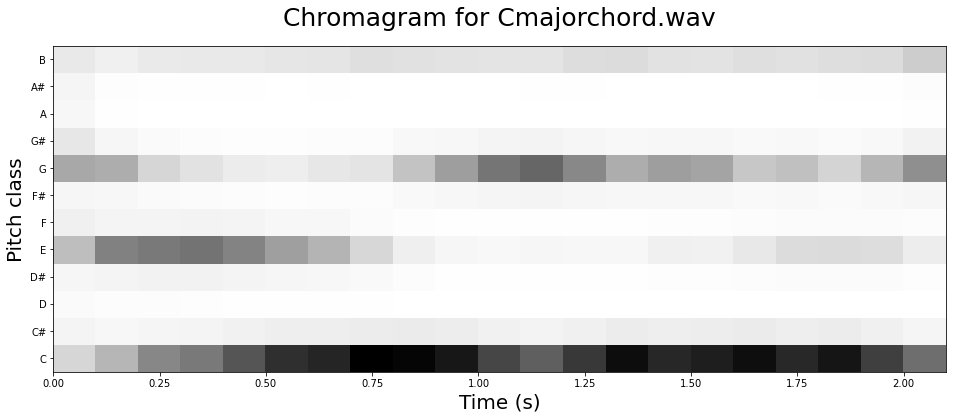

In [3]:
import matplotlib.pyplot as plt
from utils import plot_chromagram

plt.figure(figsize=(16,6))
plot_chromagram(chromagram, hopsize_s, title = "Chromagram for " + file)

The chromagram for the C chord shows nothing unexpected, with the majority of the energy over the entire sound file being found in the pitch classes C, E and G. We will now go on to exploring how the information given in the chromagram can be used.

### 2.2 Chord Templates

For each frame in the chromagram we want to decide what chord it is the most similar to. As stated before, we do this by using a template based approach. 

Chords consist of several notes played at the same time. These notes can roughly be seen as equivalent to the pitch classes described in the chromagram. There are many chords one might want to consider, but for the purpose of this project we will only focus on the twelve major and minor chords found in western music. The idea is to compare each frame of the chromagram to all of these 24 chords, and compute values describing the similarities between the frame and the chord in order to decide.

A template can be seen as a twelve dimensional vector representation of a chord. A basic approach to constructing such a representation is to set entries corresponding to notes included in the chord to 1, and all others to 0. As with the chromagram, we map the notes {C,C#,...,B} to the integers [0,11], and let these be the indices of the corresponding chords in the templates (seeing that zero-indexing is being used). The templates for all major and minor chords are represented in the images below. 
<table><tr>
<td><img src="img/Ideal_template_for_major_chords.png"  style="width: 350px;"></td>
<td><img src="img/Ideal_template_for_minor_chords.png"  style="width: 350px;"></td>
</tr></table>


There is, however, a more refined approach to constructing templates discussed in [1]. As we may know, when for instance a C note is played on a piano there are more frequencies than the fundamental one being omitted. The harmonic series for a C goes: C, C, G, C, E, G, A#, C, which is something we can take into account for our templates.

Let instead the C note be represented by the vector: $(1 + \alpha  + \alpha^3 + \alpha^7, 0, 0, 0, \alpha^4, 0, 0, \alpha^2 + \alpha^5, 0, 0, \alpha^6, 0)$ for some α in the interval [0,1], and let the template for the C chord be represented of the sum of such vectors for the notes C, E and G. We then get a more nuanced template for our chords, as illustrated in the image below where an $\alpha = 0.7$ has been used. Note that an $\alpha = 0$ gives us the same representation as suggested previously.
<table><tr>
<td><img src="img/Harmonic_template_for_major_chords.png"  style="width: 350px;"></td>
<td><img src="img/Harmonic_template_for_minor_chords.png"  style="width: 350px;"></td>
</tr></table>

As for comparing the similarity between a template and a frame of the chromagram, we do this by computing the scalar product of the two. Higher values of the scalar product therefore correspond to higher similarity between the frame and the chord represented by the template.

We compute the similarities between each frame of the chromagram and each of the 24 considered chords, starting with the original idea of setting α to 0, and obtain the plot below.

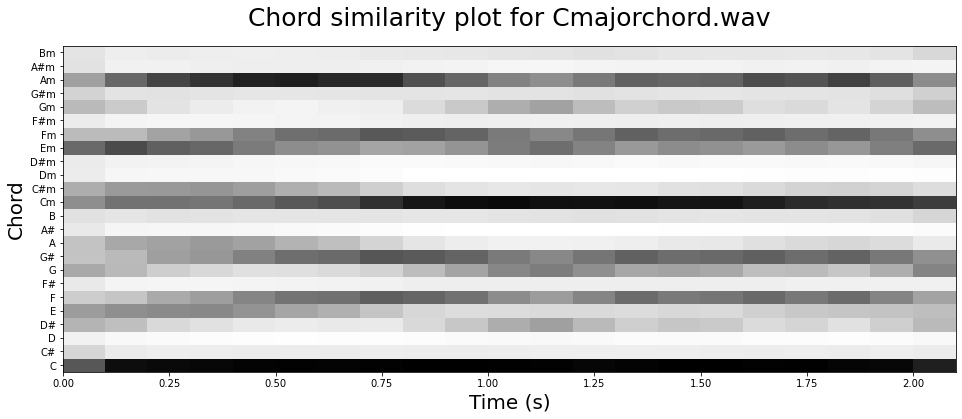

In [4]:
from utils import get_chord_template, plot_similarities
from chordrec import get_similarities

template = get_chord_template(0.0)

sim = get_similarities(chromagram,template)

plt.figure(figsize=(16,6))
plot_similarities(sim,hopsize_s, title = "Chord similarity plot for " + file)

As expected, we see the strongest similarity to the C major chord throughout the entire sound file. It is also worth noting that some similarity also is seen to the chords Am and Cm, which is also reasonable since these two only differ from the C chord by one note.

After having obtained our similarity values, it is time to make a decision as to what chord we think is being played. We do this by simply choosing the chord displaying the largest similarity value for each frame. This prediction too can be plotted over time, as shown below. 

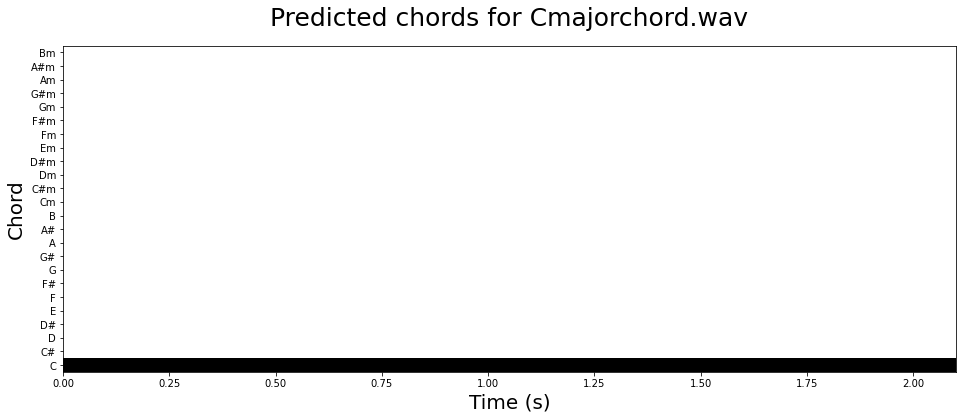

In [5]:
from chordrec import get_prediction
from utils import plot_predicted

pred = get_prediction(sim)

plt.figure(figsize=(16,6))
plot_predicted(pred,hopsize_s, title = "Predicted chords for " + file)

These results seem to indicate that our tool, as it is developed this far, can abely recognize an isolated C chord played on the piano. To make sure that this was not pure luck, let us try another sound file. We now instead have a standard 4-chord progression, C-G-Am-F, which can be found throughout most pop music played in isolation on a piano. The predicted chords can be seen below.

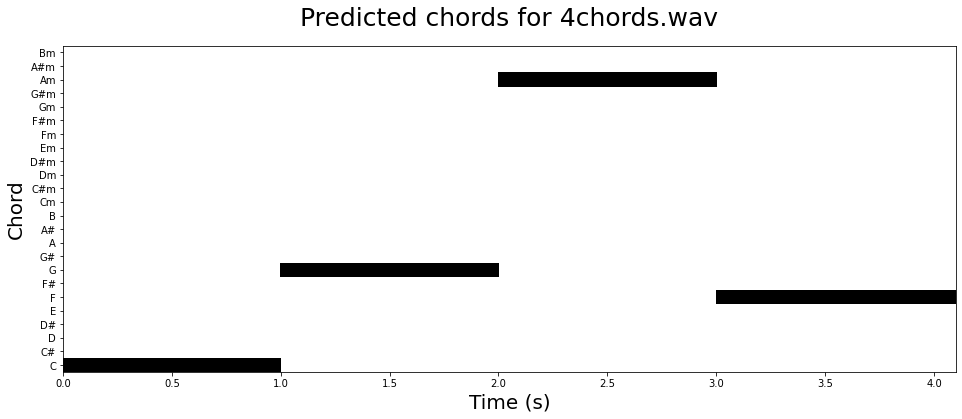

In [6]:
file = "4chords.wav"

X = librosa.load("sounds/" + file, sr = sr, mono = True)[0]

display(ipd.Audio(X, rate = sr))

chromagram = librosa.feature.chroma_stft(X, 
                                         sr = sr,
                                         norm = 1,
                                         n_fft = winsize_samples,
                                         win_length = winsize_samples,
                                         hop_length = hopsize_samples)

sim = get_similarities(chromagram,template)
pred = get_prediction(sim)

plt.figure(figsize=(16,6))
plot_predicted(pred,hopsize_s, title = "Predicted chords for " + file)

### 2.3 Evaluating accuracy

So far for the examples we have tested, we can by inspection see that the chord recognizer is able to predict the chords being played by something close to a hundred percent accuracy. Our goal is however to be able to perform chord recognition on actual recordings, which may include several instruments, noise, etc. As a first attempt to do this, we take a look at the first 30 seconds of the song "Honey Honey" by Abba; a simple pop song with uncomplicated chords.

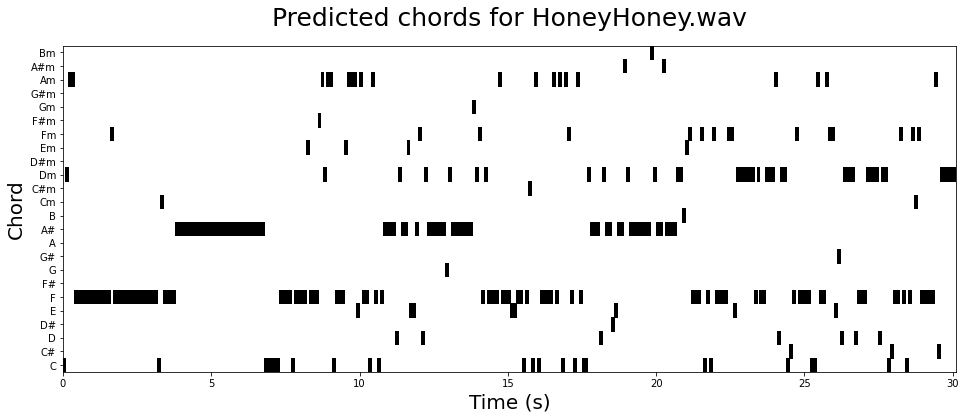

In [7]:
from chordrec import accuracy
from utils import get_annotations

file = "HoneyHoney.wav"

X = librosa.load("sounds/" + file, sr = sr, mono = True)[0]

display(ipd.Audio(X, rate = sr))

chromagram = librosa.feature.chroma_stft(X, 
                                         sr = sr,
                                         norm = 1,
                                         n_fft = winsize_samples,
                                         win_length = winsize_samples,
                                         hop_length = hopsize_samples)

sim = get_similarities(chromagram,template)
pred = get_prediction(sim)

plt.figure(figsize=(16,6))
plot_predicted(pred,hopsize_s, title = "Predicted chords for " + file)

In contrast to the results obtained earlier, the plot we see now is rather scattered and ambiguous as to which chords are being played over specific measures. We can distinguish some general patterns in the plot, but it is not entierly obvious how we are supposed to interpret the prediction. This illuminates the need for two things:

1. Methods for enhancing our chord prediction in order to decrease ambiguity.
2. An objective framework for evaluating the accuracy of a prediction.

We will start by examining the latter of these two.

Many well-known songs have their chords annotated by professional musicians. There are also data bases where these chords have been paired with timestamps where exactly where they appear in a song. Supposing that the musicians have been correct in transcribing the chords and pinpointing where they appear, this gives us a so-called $\textbf{ground truth}$ as to what is being played. These annotated chords can then become a benchmark for how well our predictor is performing.

We will use a rather simple metric for evaluating the accuracy: the ratio between frames where the predicted chord is equal to the annotated chords and the total number of frames. Certain time intervals in the annotations are marked with an "N", meaning that no chord is being played. Frames within these intervals will simply be ignored in the evaluation.

Annotations for the song "Honey Honey" can be found as a part of the McGill Billboard project [2], and will be used here. In the plot below, the predicted chords are shown in black while the annotated ones are displayed in red.

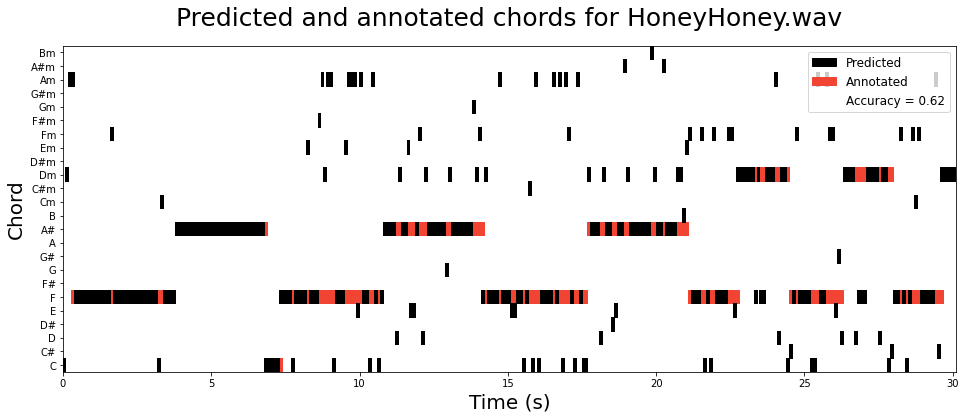

In [8]:
true_chords = get_annotations("HoneyHoney",pred.shape[1])

plt.figure(figsize=(16,6))
plot_predicted(pred,hopsize_s,annotated = true_chords,title = "Predicted and annotated chords for " + file)

We see that for about 63 % of the frames our recognizer predicted the same chord as the one annotated by the McGill Billboard project. This is an order of magnitude greater than expected results from random guessing ($1/24 \approx 0.04 = 4 \% $), but may still be too low to be useful for many practical purposes, especially considering the visible scattering. We therefore look for ways to improve performance further.

### 2.4 Enhancements

One such viable approach, especially in the purpose of reducing scattering in predictions, is to apply so called $\textit{temporal smoothing}$ to the chromagram. Let $C$ be a chromagram of  dimesnsions $12 \times N$ with frames $X = x_1, ... x_N$. For a positive integer $L$, the temporal smoothing $x_{n}^L$ of a frame $x_n \in X$ is defined by
    
$\displaystyle x_{n}^L (i) = \dfrac{1}{L} \sum_{l=0}^{L-1}{x_{n+l-\lfloor(L-1)/2\rfloor}} (i)$

In other words, temporally smoothing a chromagram is equivalent to computing its moving average over all twelve pitch classes in a window of $L$ frames. In [1], Müller uses an $L = 20$ for temporally smoothing the chromagram in a similar example, so we will start with this value as well (meaning a smoothing window of 2 seconds with our current hop size). We compare the original chromagram with the smoothed one for the first thirty seconds of "Honey Honey".

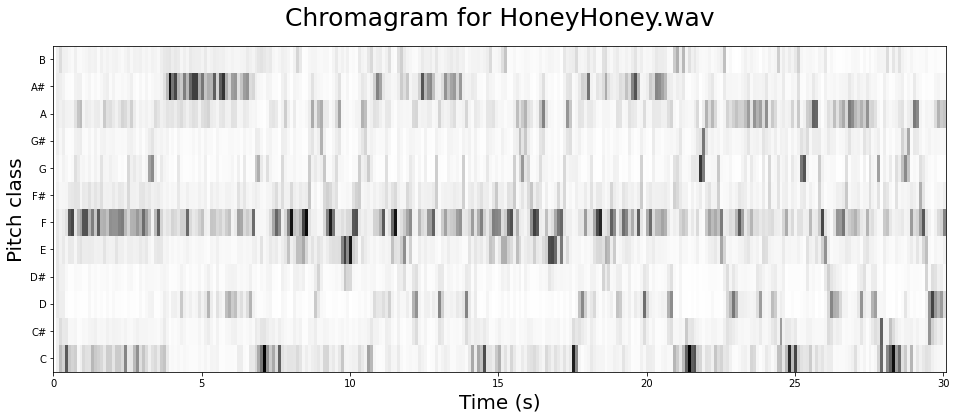

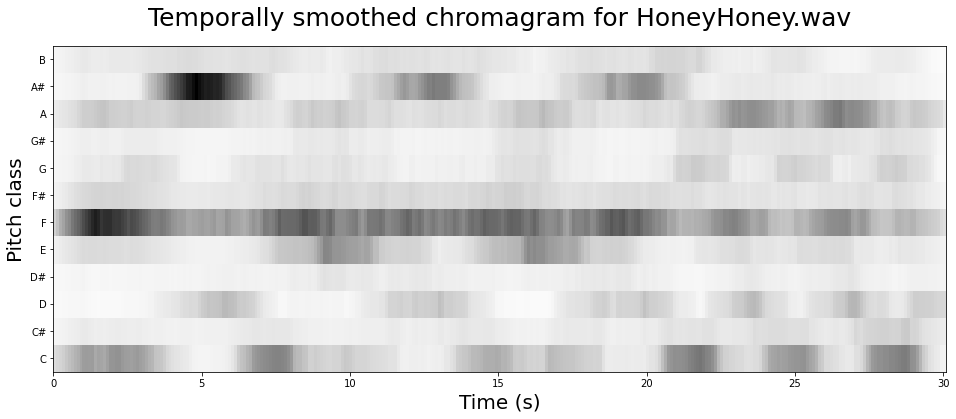

In [9]:
from chordrec import temporal_smoothing
smooth_chroma = temporal_smoothing(chromagram, L = 20)

plt.figure(figsize=(16,6))
plot_chromagram(chromagram, hopsize_s, title = "Chromagram for " + file)

plt.figure(figsize=(16,6))
plot_chromagram(smooth_chroma, hopsize_s, title = "Temporally smoothed chromagram for " + file)

The smoothed chromagram is then used to compute similarity to the various chord templates and chords are predicted as before. We obtain the following.

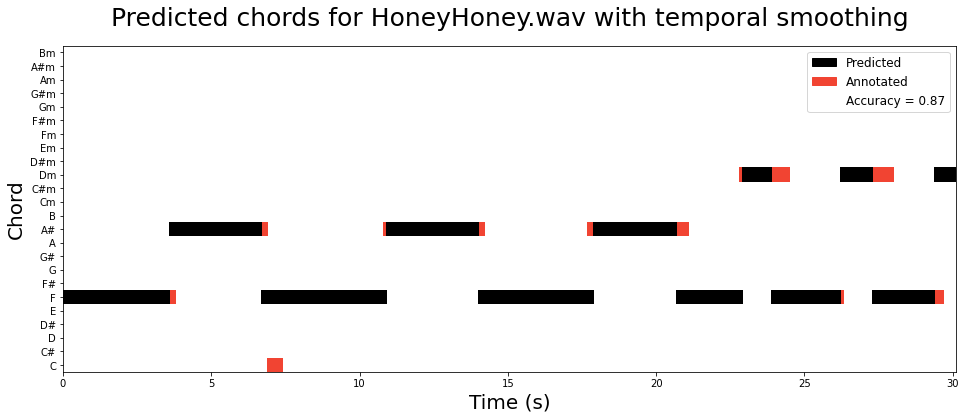

In [10]:
sim = get_similarities(smooth_chroma,template)
pred = get_prediction(sim)

plt.figure(figsize=(16,6))
plot_predicted(pred,hopsize_s,annotated = true_chords,title = "Predicted chords for " + file + " with temporal smoothing")

The accuracy (or ratio of correctly predicted frames) is with this enhancement and for this example increased from 62 % to 87 %. Observing the plot above, we also note that the scattering behaviour seen before is no longer present. The ways in which the predictions are wrong are not so much in the chords predicted, but rather in the time instances where changes appear, which is likely a result of the predictor taking into account frames before and after the current time. Where this happens after about 20 seconds, with chord changes between F and Dm, it is however worth noting that these two chords share two notes which may be a cause of ambiguity.

Müller also suggests performing a "spectral enhancement" of the chromagram using $\textit{logarithmic compression}$. For a chromagram $C$ and a number $\gamma$, the logarithmic compression $C_{\gamma}$ is defined as 

$C_{\gamma} = log(1 + \gamma \cdot C)$

I did however not find that applying such a compression improved the accuracy of the predictions in my case. The following graph showcases accuracy as a function of $\gamma$, for values $L = 20$ for temporal smoothing and $\alpha = 0$ when computing the templates. For this reason, logarithmic compression is not performed from here on.

<img src="img/acc_gamma.png"  style="width: 500px;">

Without logarithmic compression we have two parameters that we may want to adjust: $L$ and $\alpha$. In order to obtain optimal values for these, we do an exhaustive search comparing the accuracies obtained for "HoneyHoney.wav" for all $\alpha \in [0, 0.1, 0.2, ... , 1.0]$ and $L \in [2,3,...,39,40]$, which we can assume to be reasonable intervals for the two. The results tell us that (for this sound file and these annotations) the highest accuracy is given by $\alpha = 0.4$ and $L = 23$. These parameters give the following prediction.

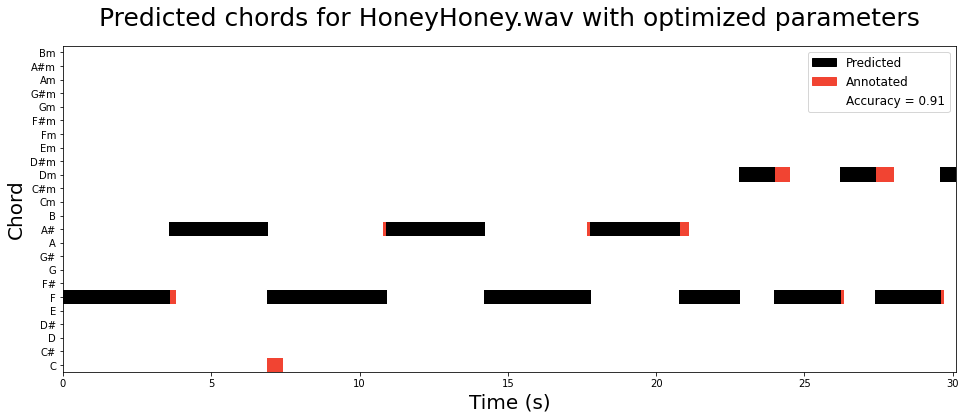

In [11]:
template = get_chord_template(0.4)
smooth_chroma = temporal_smoothing(chromagram, L = 23)

sim = get_similarities(smooth_chroma,template)
pred = get_prediction(sim)

plt.figure(figsize=(16,6))
plot_predicted(pred,hopsize_s,annotated = true_chords,title = "Predicted chords for " + file + " with optimized parameters")

## 3. Limitations of the model

The results obtained in the previous section, with the correct chord being predicted in 91% of the frames, may reasonably be seen as successful and it is feasible that one might have use of the results for one or some of the applications discussed in the introduction. Now we however want to explore the limitations of the model and see where it breaks down by looking at two examples. These are "Helter Skelter" by The Beatles and "The Girl from Ipanema" as performed by Stan Getz and Antonio Carlos Jobim.

The rational for choosing these two is that they harmonically differ from the song "Honey Honey" in some ways. The song "Helter Skelter", which by many has been seen as a precursor to the heavy metal genre, is not so much a "chord-based" as a "riff-based" song. We thus do not expect to encounter well defined chords in the classical sense in the music. "The Girl from Ipanema" on the other hand has a chord-based instrumental section, but the chords being used are much more colorful than any included in our templates.

As for the variables $L$ and $\alpha$, we will do two predictions for each song: one using the same values that we obtained in the previous section and one where we optimize for accuracy as we have defined it by exhaustively evaluating the results for an interval of values for $L$ and $\alpha$.

### 3.1 Helter Skelter

Even though this song may not be chord-based in the same way as "Honey Honey", there are chord annotations made of the song [3]. There is some color to these chords; for example an E:(1,b7)/b7 appears in the first few seconds. Since our template however does not support these types of chords, we will simply map them unto the "base chord" which would be an E in this case.

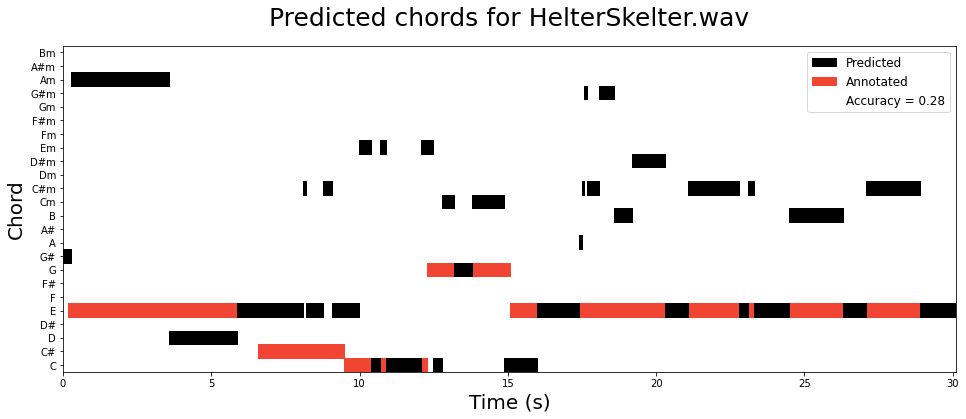

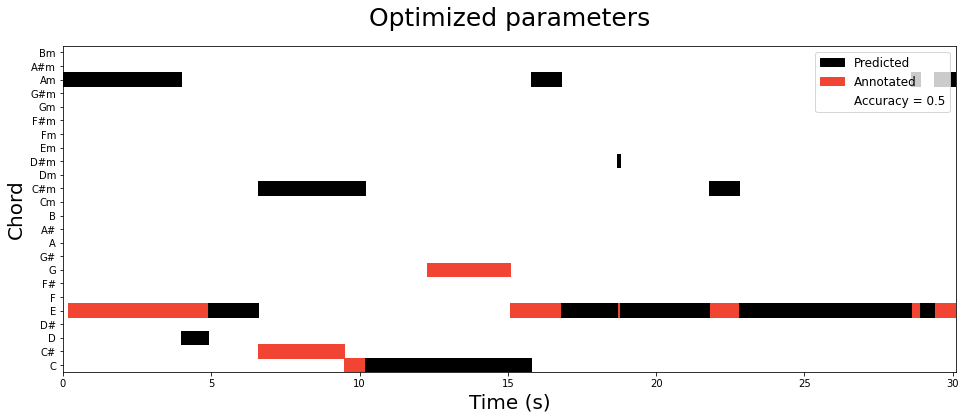

In [12]:
file = "HelterSkelter.wav"

X = librosa.load("sounds/" + file, sr = sr, mono = True)[0]

display(ipd.Audio(X, rate = sr))

chromagram = librosa.feature.chroma_stft(X, 
                                         sr = sr,
                                         norm = 1,
                                         n_fft = winsize_samples,
                                         win_length = winsize_samples,
                                         hop_length = hopsize_samples)

for a,L,title in zip([0.4,1.0],[23,39],["Predicted chords for " + file,"Optimized parameters"]):

    template = get_chord_template(float(a))

    smooth_chroma = temporal_smoothing(chromagram, L = L)

    sim = get_similarities(smooth_chroma,template)
    pred = get_prediction(sim)

    true_chords = get_annotations("HelterSkelter",pred.shape[1])

    plt.figure(figsize=(16,6))
    plot_predicted(pred,hopsize_s,annotated = true_chords,title = title)

We now obtain an accuracy of 0.28 using the same parameters for $L$ and $\alpha$ as before, significantly lower than in the previous section. The plot also looks a lot more scattered, in spite of the temporal smoothing. 

These results are however not entirely unexpected. For one, the recording is harmonically rather noisy. Nor is it clear from listening to it that there is any one chord persisting over a longer period of time, especially after the intro. This may have been a problem for the musicians annotating the music as well, since the entire section between 15 and 30 seconds simply is labeled "E", whereas we can hear that there is a lot more going on. For this reason, it is also relevant to ask oneself what a desirable recognition would consist in for a song such as this.

Optimizing $L$ and $\alpha$ does seem to significantly improve the performance. However, this song seems to be a lot more sensitive to changes in these parameters than the Abba song and it is probably not a reliable option having to fine-tune these parameters for each new track.

### 3.2 The girl from Ipanema

The number of colored chords and the complexity of the coloring both increase significantly with this song. We however use the same method for mapping the annotated chords unto the basic chords in our templates, i.e. Eb:min9/5 is interpreted as an Ebm (or D#m since we do not discriminate between the two) etc. The following results are obtained.

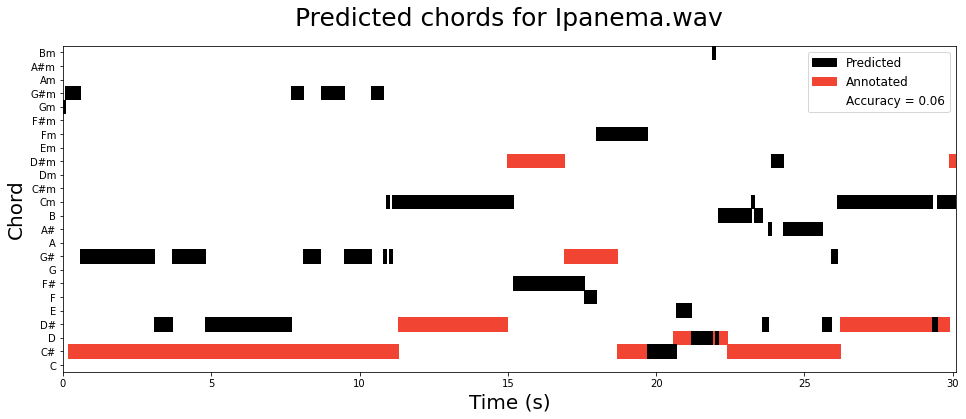

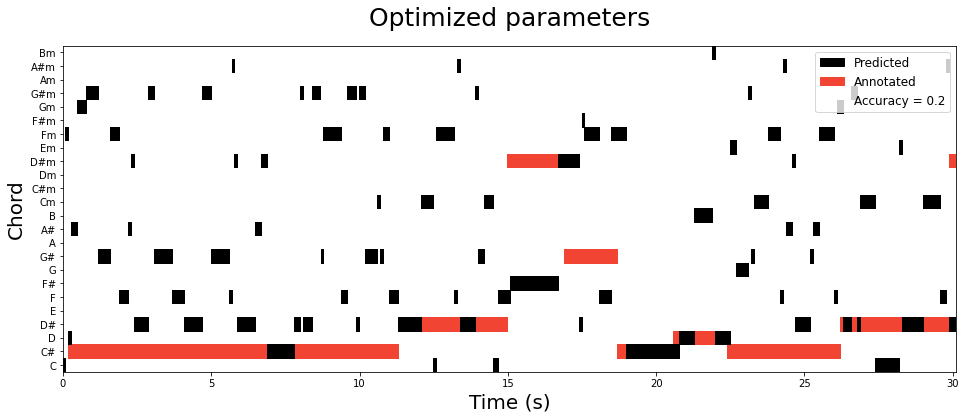

In [13]:
file = "Ipanema.wav"

X = librosa.load("sounds/" + file, sr = sr, mono = True)[0]

display(ipd.Audio(X, rate = sr))

chromagram = librosa.feature.chroma_stft(X, 
                                         sr = sr,
                                         norm = 1,
                                         n_fft = winsize_samples,
                                         win_length = winsize_samples,
                                         hop_length = hopsize_samples)

true_chords = get_annotations("Ipanema",pred.shape[1])

for a,L,title in zip([0.4,0.5],[23,8],["Predicted chords for " + file,"Optimized parameters"]):
    template = get_chord_template(float(a))
    smooth_chroma = temporal_smoothing(chromagram, L = L)

    sim = get_similarities(smooth_chroma,template)
    pred = get_prediction(sim)

    plt.figure(figsize=(16,6))
    plot_predicted(pred,hopsize_s,annotated = true_chords,title = title)

The results do at first glance seem a bit disheartening with a reported accuracy of 0.06, which is only a little better than randomness. Inspecting the first plot, we can guess that much of this comes down to chord ambiguity. For example, the first 12 or so seconds of the song are annotated as Db6add9/Ab, or C#6add9/G# to be consistent with our notation. This chord is mapped to a C#, whereas the predictions were going between G#, G#m and D#. 

C#6add9/G# does have a G# in its root which is accentuated in the recorded guitar during this part. The vocals also go between the notes D#, C and A#. G#, C and D# make up the major G# chord, which may be why this is present in the predictions. The C# note is actually not accentuated at all in the section, neither by the voice nor the guitar. The 9th - a D# - however is, which may be why the D# chord was predicted. Other than this, many errors seem to occur where a relative minor is predicted instead of the annotated chord, for example a D# being interpreted as a Cm.

The optimization of $L$ and $\alpha$, while technically increasing the number of correctly guessed frames, leads to a very scattered prediction over all which does not tell us much about anything. There is also the risk that we may be optimizing for "the wrong things", seeing for example that we are not sure that the mapping of colored chords to simpler ones is done optimally.

It is clear that my chord recognizer does not have the ability to manage this level of harmonization in songs - nor was it designed to. One obvious step that one might want to try would be to add more templates so as to be able to capture a larger range of harmonies. This could however potentially have the drawback of introducing more ambiguity in the prediction process. Another approach one might take, given the access to a large library of annotated songs, would be to train an HMM that predicts chords based on how they normally appear in similar music.

## 4. Conclusions

In conclusion, the approach to chord recognition implemented in this project seems to be working very well for songs with simple chords. Luckily, since this is the case for much of the popular music released over the last 50-60 years, the developed recognizer may indeed have its applications. Of the enhancements made to the initial approach, temporal smoothing by far seems to have been the most effective in improving performance whereas logarithmic compression generally seemed to decrease the accuracy of the predictions if anything.

The recognizer seems to be the most unreliable when it comes to predicting chords where complex harmonic structures are present, as was the case with "The Girl from Ipanema". It also struggled to identify the chords of the riff based and somewhat noisy Beatles song, although an optimization of parameters visibly helped.

As mentioned in the previous section, possible ways to improve the ability for recognition include adding more templates, which may come at the cost of larger ambiguity which will have to be dealt with, and changing the approach to for example using HMM (something described in more detail in [1]). These are however outside the scope of this project and may be considered for future endeavours.

## 5. References

[1] M. Müller, $\textit{Fundamentals of music processing: Audio, analysis, algorithms, applications.}$  Springer, 2015.

[2] The McGill Billboard Project. [Online]. Available:  https://ddmal.music.mcgill.ca/research/TheMcGillBillboardProject(ChordAnalysisDataset)/

[3] Reference Annotations: The Beatles. [Online]. Available: http://isophonics.net/content/reference-annotations-beatles

[4] Jazz Audio-Aligned Harmony (JAAH) Dataset. [Online]. Available: https://github.com/MTG/JAAH/